# Generation dataset with mountains for NER model

This notebook creates synthetic dataset for BERT model.
It generates some number of sentences (2000 in our example), based on random chosen mountain names and templates. Finally, it saves dataset in json format.

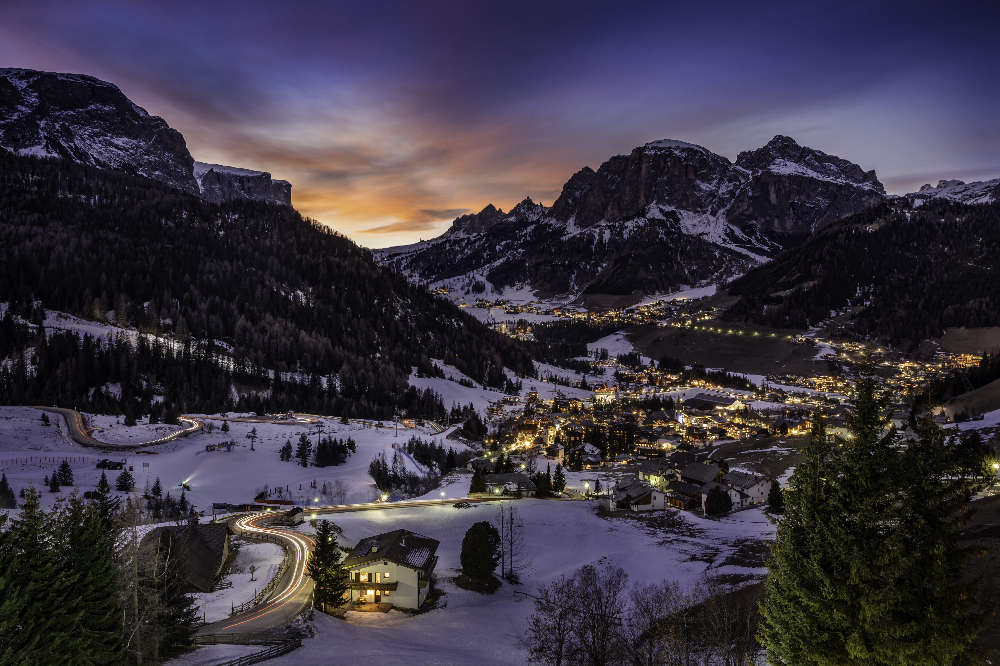

### Importing libraries

In [ ]:
import json
import random

In [ ]:
from pathlib import Path

### Creating a list of mountained, can be generated by ChatGPT etc.
### Moreover, we create some templates for future sentences.

In [ ]:
MOUNTAINS = [
    "Mount Everest",
    "K2",
    "Kangchenjunga",
    "Lhotse",
    "Makalu",
    "Cho Oyu",
    "Dhaulagiri",
    "Manaslu",
    "Nanga Parbat",
    "Annapurna",
    "Gasherbrum I",
    "Broad Peak",
    "Gasherbrum II",
    "Shishapangma",
    "Mont Blanc",
    "Matterhorn",
    "Denali",
    "Mount Elbrus",
    "Mount Kilimanjaro",
    "Aconcagua",
    "Mount Fuji",
    "Mount Rainier",
    "The Eiger",
    "Mount Vinson",
    "Puncak Jaya",
]

In [ ]:
TEMPLATES = [
    "We plan to climb {}.",
    "The view from {} is breathtaking.",
    "Many adventurers dream of summiting {}.",
    "{} is one of the world's highest peaks.",
    "The expedition to {} was successful.",
    "Have you ever heard of {}?",
    "Next year, I will visit {}.",
    "The climber reached the peak of {}.",
    "{} is located in the Himalayas.",
    "How tall is {}?",
]

### Generation functions

In [ ]:
def make_sentence_and_labels(mountain):
    """
    Generates a sentence, which includes the given mountain, and adds the start and the end indexes.

    :param animal: Mountain name to include in the sentence
    :return: sentence - generated sentence with the mountain, labels - list of tuples with start and end
    indexes
    """
    template = random.choice(TEMPLATES)

    sentence = template.format(mountain)
    search_mountain = mountain

    search_sentence = sentence.lower()
    search_word = search_mountain.lower()

    start = search_sentence.find(search_word)

    end = start + len(search_word)

    labels = [(start, end)]
    return sentence, labels

In [ ]:
def make_dataset(n_samples):
    """
    Generates a dataset with n_samples samples using the function to create sentences and labels.

    :param n_samples: Number of samples to generate
    :return: texts - list of generated sentences, entities - list of labels (start, end) for each sentence
    """
    dataset = []

    for i in range(n_samples):
        mountain = random.choice(MOUNTAINS)
        sentence, spans = make_sentence_and_labels(mountain)

        dataset.append({"text": sentence, "spans": spans})

    return dataset

### Saving dataset to the **dataset** directory

Creating an output foler if it does not exist

In [ ]:
def save_dataset(dataset, filepath):
    with open(filepath, "w", encoding="utf-8") as f:
        f.write(json.dumps(dataset))

In [ ]:
output_path = Path("dataset")

In [ ]:
output_path.mkdir(parents=True, exist_ok=True)

In [ ]:
output_file = "dataset/dataset.json"

In [ ]:
save_dataset(train_dataset, output_file)

In [ ]:
train_dataset = make_dataset(2000) # do 2000 sentences

In [ ]:
# First 5 sentences as an example
train_dataset[:5]